In [4]:
import scanpy as sc
import cell2location
import pandas as pd
import numpy as np
import torch
torch.cuda.is_available()

True

In [5]:
from os import makedirs
from os.path import exists

ref_run_name=r'ref_data/Brain_E-MTAB-11115/reference_signatures'

if not exists(ref_run_name):
    makedirs(ref_run_name)


## importing sc_data

In [3]:
df_cell_annotation=pd.read_csv(r"ref_data\Brain_E-MTAB-11115\cell_annotation.csv")
df_cell_annotation.index=df_cell_annotation['Cell ID']
df_cell_annotation

,Cell ID,sample,annotation_1,annotation_1_print
Cell ID,,,,
5705STDY8058283_AAACCCAAGCCTATTG-1,5705STDY8058283_AAACCCAAGCCTATTG-1,5705STDY8058283,Ext_L23,22_Ext_L23
5705STDY8058283_AAACCCAAGGTCATAA-1,5705STDY8058283_AAACCCAAGGTCATAA-1,5705STDY8058283,Oligo_2,59_Oligo_2
5705STDY8058283_AAACCCACAACCCTCT-1,5705STDY8058283_AAACCCACAACCCTCT-1,5705STDY8058283,Oligo_2,59_Oligo_2
5705STDY8058283_AAACCCAGTGCTATTG-1,5705STDY8058283_AAACCCAGTGCTATTG-1,5705STDY8058283,Astro_THAL_med,10_Astro_THAL_med
5705STDY8058283_AAACCCAGTTCACCGG-1,5705STDY8058283_AAACCCAGTTCACCGG-1,5705STDY8058283,Inh_Sst,49_Inh_Sst
...,...,...,...,...
5705STDY8058280_TTTGTTGCAGAGTGAC-1,5705STDY8058280_TTTGTTGCAGAGTGAC-1,5705STDY8058280,Micro,53_Micro
5705STDY8058280_TTTGTTGCATCGCTCT-1,5705STDY8058280_TTTGTTGCATCGCTCT-1,5705STDY8058280,Oligo_2,59_Oligo_2
5705STDY8058280_TTTGTTGGTATGGTAA-1,5705STDY8058280_TTTGTTGGTATGGTAA-1,5705STDY8058280,Inh_Meis2_3,46_Inh_Meis2_3


In [ ]:
if 'adata_raw_sc' in globals():
    del adata_raw_sc

for sample in set(df_cell_annotation['sample']):
    print(sample)
    if 'adata_raw_sc' in globals():
        adata_1=sc.read_10x_h5(r'D:\whd\STtreatment\ref_data\Brain_E-MTAB-11115/'+sample+'_filtered_feature_bc_matrix.h5')
        adata_1.var['Symbol'] = adata_1.var_names
        adata_1.var.set_index('gene_ids', drop=True, inplace=True)
        adata_1.obs_names=[sample+'_'+i for i in adata_1.obs_names]
        adata_1.obs['sample']=sample
        adata_1=adata_1[[i in df_cell_annotation.index for i in adata_1.obs_names]]
        adata_1.obs['annotation_1']=df_cell_annotation.loc[adata_1.obs_names,'annotation_1']
        adata_1.obs['annotation_1_print']=df_cell_annotation.loc[adata_1.obs_names,'annotation_1_print']
        adata_raw_sc = adata_raw_sc.concatenate(adata_1,join='outer')
        
    else:
        adata_1=sc.read_10x_h5(r'D:\whd\STtreatment\ref_data\Brain_E-MTAB-11115/'+sample+'_filtered_feature_bc_matrix.h5')
        adata_1.var['Symbol'] = adata_1.var_names
        adata_1.var.set_index('gene_ids', drop=True, inplace=True)
        adata_1.obs_names=[sample+'_'+i for i in adata_1.obs_names]
        adata_1.obs['sample']=sample
        adata_1=adata_1[[i in df_cell_annotation.index for i in adata_1.obs_names]]
        adata_1.obs['annotation_1']=df_cell_annotation.loc[adata_1.obs_names,'annotation_1']
        adata_1.obs['annotation_1_print']=df_cell_annotation.loc[adata_1.obs_names,'annotation_1_print']

        adata_raw_sc = adata_1.copy()

In [5]:
adata_raw_sc

AnnData object with n_obs × n_vars = 40532 × 31053
    obs: 'sample', 'annotation_1', 'annotation_1_print', 'batch'
    var: 'feature_types', 'genome', 'Symbol'

In [6]:
adata_raw_sc=adata_raw_sc[adata_raw_sc.obs['annotation_1']!='Unk_1']
adata_raw_sc=adata_raw_sc[adata_raw_sc.obs['annotation_1']!='Unk_2']
adata_raw_sc=adata_raw_sc[adata_raw_sc.obs['annotation_1']!='LowQ_1']
adata_raw_sc=adata_raw_sc[adata_raw_sc.obs['annotation_1']!='LowQ_2']
sc.pp.filter_genes(adata_raw_sc, min_cells=10)
adata_raw_sc

c:\Users\Zhao Lab\.conda\envs\c2l\lib\site-packages\scanpy\preprocessing\_simple.py:293: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["n_cells"] = number


AnnData object with n_obs × n_vars = 39208 × 23244
    obs: 'sample', 'annotation_1', 'annotation_1_print', 'batch'
    var: 'feature_types', 'genome', 'Symbol', 'n_cells'

In [7]:
adata_raw_sc.write(r"D:\whd\STtreatment\ref_data\Brain_E-MTAB-11115\adata_raw_sc.h5ad")

In [ ]:
from cell2location.utils.filtering import filter_genes
selected = filter_genes(adata_raw_sc, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12)
# filter the object
adata_filter_sc = adata_raw_sc[:, selected].copy() 

In [9]:
adata_filter_sc

AnnData object with n_obs × n_vars = 39208 × 12872
    obs: 'sample', 'annotation_1', 'annotation_1_print', 'batch'
    var: 'feature_types', 'genome', 'Symbol', 'n_cells', 'nonz_mean'

In [10]:
# prepare anndata for the regression model
cell2location.models.RegressionModel.setup_anndata(adata=adata_filter_sc,
                        batch_key='sample',
                        labels_key='annotation_1',
                        categorical_covariate_keys=None
                       )

In [14]:
# create the regression model
from cell2location.models import RegressionModel
mod = RegressionModel(adata_filter_sc)

# view anndata_setup as a sanity check
mod.view_anndata_setup()

Anndata setup with scvi-tools version 1.3.3.

Setup via `RegressionModel.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'sample',
│   'labels_key': 'annotation_1',
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   6   │
│         n_cells          │ 39208 │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │  55   │
│          n_vars          │ 12872 │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                     batch State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃   Categories    ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sample'] │ 5705STDY8058280 │          0          │
│                     │ 5705STDY8058281 │          1          │
│                     │ 5705STDY8058282 │          2          │
│                     │ 5705STDY8058283 │          3          │
│                     │ 5705STDY8058284 │          4          │
│                     │ 5705STDY8058285 │          5          │
└─────────────────────┴─────────────────┴─────────────────────┘

                       labels State Registry                        
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃   Categories   ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['annotation_1'] │   Astro_AMY    │          0          │
│                           │ Astro_AMY_CTX  │          1          │
│                           │   Astro_CTX    │          2          │
│                           │   Astro_HPC    │          3          │
│                           │   Astro_HYPO   │          4          │
│                           │   Astro_STR    │          5          │
│                           │ Astro_THAL_hab │          6          │
│                           │ Astro_THAL_lat │          7          │
│                           │ Astro_THAL_med │          8          │
│                           │    Astro_WM    │          9          │
│                           │      Endo      │         10          │
│                           │   Ext_Amy_1    │         11          │
│                           │   Ext_Amy_2    │         12          │
│                           │  Ext_ClauPyr   │         13          │
│                           │  Ext_Hpc_CA1   │         14          │
│                           │  Ext_Hpc_CA2   │         15          │
│                           │  Ext_Hpc_CA3   │         16          │
│                           │  Ext_Hpc_DG1   │         17          │
│                           │  Ext_Hpc_DG2   │         18          │
│                           │    Ext_L5_1    │         19          │
│                           │    Ext_L5_2    │         20          │
│                           │    Ext_L5_3    │         21          │
│                           │     Ext_L6     │         22          │
│                           │    Ext_L6B     │         23          │
│                           │    Ext_L23     │         24          │
│                           │    Ext_L25     │         25          │
│                           │    Ext_L56     │         26          │
│                           │    Ext_Med     │         27          │
│                           │    Ext_Pir     │         28          │
│                           │   Ext_Thal_1   │         29          │
│                           │   Ext_Thal_2   │         30          │
│                           │   Ext_Unk_1    │         31          │
│                           │   Ext_Unk_2    │         32          │
│                           │   Ext_Unk_3    │         33          │
│                           │     Inh_1      │         34          │
│                           │     Inh_2      │         35          │
│                           │     Inh_3      │         36          │
│                           │     Inh_4      │         37          │
│                           │     Inh_5      │         38          │
│                           │     Inh_6      │         39          │
│                           │   Inh_Lamp5    │         40          │
│                           │  Inh_Meis2_1   │         41          │
│                           │  Inh_Meis2_2   │         42          │
│                           │  Inh_Meis2_3   │         43          │
│                           │  Inh_Meis2_4   │         44          │
│                           │   Inh_Pvalb    │         45          │
│                           │    Inh_Sst     │         46          │
│                           │    Inh_Vip     │         47          │
│                           │     Micro      │         48          │
│                           │      Nb_1      │         49          │
│                           │      Nb_2      │         50          │
│                           │     OPC_1      │         51          │
│                           │     OPC_2      │         52          │
│                           │    Oligo_1     │         53          

In [15]:
mod.train(max_epochs=250, accelerator="gpu")

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
c:\Users\Zhao Lab\.conda\envs\c2l\lib\site-packages\lightning\pytorch\trainer\configuration_validator.py:68: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


c:\Users\Zhao Lab\.conda\envs\c2l\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:433: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Epoch 250/250: 100%|██████████| 250/250 [05:21<00:00,  1.29s/it, v_num=1, elbo_train=2.48e+8]

`Trainer.fit` stopped: `max_epochs=250` reached.


Epoch 250/250: 100%|██████████| 250/250 [05:21<00:00,  1.29s/it, v_num=1, elbo_train=2.48e+8]


In [ ]:
mod.plot_history(0)

In [ ]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_filter_sc = mod.export_posterior(
    adata_filter_sc, 
    sample_kwargs = {'num_samples': 1000, 'batch_size': 2500},
    export_slot = 'mod',
    add_to_varm = ["means","stds","q05","q95"],
    scale_average_detection = True
)

In [23]:
# Save model
mod.save(f"{ref_run_name}", overwrite=True)

# Save anndata object with results
adata_file = f"{ref_run_name}/sc.h5ad"
adata_filter_sc.write(adata_file)
adata_file

'ref_data/Brain_E-MTAB-11115/reference_signatures/sc.h5ad'

In [107]:
# Reload data
adata_file = f"{ref_run_name}/sc.h5ad"
adata_filter_sc = sc.read_h5ad(adata_file)
mod = cell2location.models.RegressionModel.load(ref_run_name, adata_filter_sc)
adata_filter_sc = mod.export_posterior(
    adata_filter_sc, 
    sample_kwargs = {'num_samples': 1000, 'batch_size': 2500},
    export_slot = 'mod',
    add_to_varm = ["means","stds","q05","q95"],
    scale_average_detection = True
)

INFO     File ref_data/Brain_E-MTAB-11115/reference_signatures\model.pt already downloaded                         


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
c:\Users\Zhao Lab\.conda\envs\c2l\lib\site-packages\lightning\pytorch\trainer\configuration_validator.py:68: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\Users\Zhao Lab\.conda\envs\c2l\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:433: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Epoch 1/510:   0%|          | 1/510 [00:00<01:26,  5.90it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Sampling global variables, sample: 100%|██████████| 999/999 [00:07<00:00, 132.13it/s]


In [ ]:
mod.plot_QC()

In [109]:
# export estimated expression in each cluster
if 'means_per_cluster_mu_fg' in adata_filter_sc.varm.keys():
    inf_aver = adata_filter_sc.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_filter_sc.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_filter_sc.var[[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_filter_sc.uns['mod']['factor_names']]].copy()
inf_aver.columns = adata_filter_sc.uns['mod']['factor_names']
inf_aver.iloc[0:5, 0:5]

,Astro_AMY,Astro_AMY_CTX,Astro_CTX,Astro_HPC,Astro_HYPO
gene_ids,,,,,
ENSMUSG00000051951,0.043191,0.081768,0.060246,0.063373,0.088115
ENSMUSG00000089699,0.004701,0.006641,0.009504,0.007532,0.016090
ENSMUSG00000025902,0.002011,0.004141,0.002722,0.003752,0.002154
ENSMUSG00000033845,0.119464,0.056034,0.099269,0.069841,0.084006
ENSMUSG00000033813,0.100079,0.111622,0.144192,0.101303,0.097395


In [110]:
inf_aver.to_csv(f'{ref_run_name}/inf_aver.csv')

In [111]:
inf_aver=pd.read_csv(f'{ref_run_name}/inf_aver.csv',index_col=0)
inf_aver

,Astro_AMY,Astro_AMY_CTX,Astro_CTX,Astro_HPC,Astro_HYPO,Astro_STR,Astro_THAL_hab,Astro_THAL_lat,Astro_THAL_med,Astro_WM,...,Inh_Pvalb,Inh_Sst,Inh_Vip,Micro,Nb_1,Nb_2,OPC_1,OPC_2,Oligo_1,Oligo_2
gene_ids,,,,,,,,,,,,,,,,,,,,,
ENSMUSG00000051951,0.043191,0.081768,0.060246,0.063373,0.088115,0.011957,0.042905,0.075994,0.104240,0.167802,...,16.499676,18.154430,6.996837,0.060170,2.566743,0.749940,2.431074,0.983628,2.402154,1.053483
ENSMUSG00000089699,0.004701,0.006641,0.009504,0.007532,0.016090,0.036502,0.023271,0.006161,0.005587,0.028660,...,3.068536,3.404815,1.209553,0.002866,0.557626,0.156870,0.426502,0.194995,0.464481,0.194606
ENSMUSG00000025902,0.002011,0.004141,0.002722,0.003752,0.002154,0.013666,0.020543,0.003510,0.002514,0.005082,...,0.001664,0.001683,0.003770,0.000978,0.005345,0.005225,0.001199,0.003433,0.001716,0.000103
ENSMUSG00000033845,0.119464,0.056034,0.099269,0.069841,0.084006,0.042417,0.093324,0.090662,0.119486,0.070124,...,0.303566,0.286174,0.160071,0.045737,0.106512,0.106183,0.094345,0.095930,0.087519,0.061461
ENSMUSG00000033813,0.100079,0.111622,0.144192,0.101303,0.097395,0.146497,0.089678,0.072974,0.090022,0.086277,...,0.351644,0.289085,0.255751,0.074709,0.105792,0.131486,0.122518,0.191857,0.148943,0.076850
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSMUSG00000064370,0.155629,0.131665,0.106565,0.123754,0.070327,0.096834,0.259523,0.087281,0.072558,0.332388,...,0.397219,0.296221,0.214255,0.045440,0.134903,0.077151,0.111018,0.116896,0.047798,0.060429
ENSMUSG00000051412,0.042725,0.042562,0.050841,0.057432,0.042240,0.079012,0.021032,0.033895,0.042015,0.073269,...,0.095834,0.126863,0.115308,0.015447,0.066852,0.067635,0.088289,0.110441,0.103195,0.072210
ENSMUSG00000079834,0.253532,0.270251,0.337664,0.251551,0.293846,0.441932,0.203929,0.354224,0.335975,0.090957,...,0.462510,0.514941,0.406644,0.077013,0.109780,0.038480,0.322621,0.330032,0.289688,0.133356


## improting st_data

In [35]:
result_folder='WJ04242'
run_name=f'{result_folder}/cell2location_map'
if not exists(run_name):
    makedirs(run_name)
adata_st=sc.read(rf'{result_folder}\filtered_adata.h5ad')

In [36]:
adata_st.var["mt"] = adata_st.var_names.str.startswith("mt-")
adata_st = adata_st[:, ~adata_st.var['mt'].values]

In [37]:
adata_st.var['gene_name'] = adata_st.var_names
adata_st.var.set_index('Gene_id', drop=True, inplace=True)
adata_st.var_names_make_unique()

C:\Users\Zhao Lab\AppData\Local\Temp\ipykernel_103864\2820825191.py:1: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata_st.var['gene_name'] = adata_st.var_names


In [38]:
inf_aver=pd.read_csv(f'{ref_run_name}/inf_aver.csv',index_col=0)
# find shared genes and subset both anndata and reference signatures
intersect = np.intersect1d(adata_st.var_names, inf_aver.index)
adata_st = adata_st[:, intersect].copy()
inf_aver = inf_aver.loc[intersect, :].copy()

# prepare anndata for cell2location model
cell2location.models.Cell2location.setup_anndata(adata=adata_st, batch_key="sample")

In [39]:
adata_st

AnnData object with n_obs × n_vars = 1021 × 12636
    obs: 'sample', 'col', 'row', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'log1p_total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'batch', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'Gene_type', 'n_cells', 'mt', 'rp', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'gene_name'
    uns: 'spatial', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'spatial'

In [40]:
#如果出现了小数
import numpy as np
import scipy.sparse as sp

# ==========================================
# 1. 消除负数：将所有小于 0 的异常值强行置为 0
# ==========================================
if sp.issparse(adata_st.X):
    # 针对稀疏矩阵的处理
    adata_st.X.data[adata_st.X.data < 0] = 0
else:
    # 针对普通密集矩阵的处理
    adata_st.X[adata_st.X < 0] = 0

# ==========================================
# 2. 四舍五入并转换为纯整数类型 (int32)
# ==========================================
if sp.issparse(adata_st.X):
    adata_st.X.data = np.round(adata_st.X.data).astype(np.int32)
else:
    adata_st.X = np.round(adata_st.X).astype(np.int32)

# ==========================================
# 3. 验证检查
# ==========================================
print("✅ 数据修复完成！目前矩阵的数据类型为：", adata_st.X.dtype)
if sp.issparse(adata_st.X):
    print("✅ 前 5x5 个数据预览:\n", adata_st.X[:5, :5].toarray())
else:
    print("✅ 前 5x5 个数据预览:\n", adata_st.X[:5, :5])

✅ 数据修复完成！目前矩阵的数据类型为： int32
✅ 前 5x5 个数据预览:
 [[0 1 0 1 8]
 [0 3 0 3 5]
 [1 0 1 0 5]
 [0 0 0 1 6]
 [1 2 1 2 5]]


In [41]:
# create and train the model
mod = cell2location.models.Cell2location(
    adata_st, cell_state_df=inf_aver,
    N_cells_per_location=25,
    detection_alpha=20, 
    detection_mean_per_sample=False 
)
mod.view_anndata_setup()

Anndata setup with scvi-tools version 1.3.3.

Setup via `Cell2location.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'sample',
│   'labels_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   1   │
│         n_cells          │ 1021  │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   1   │
│          n_vars          │ 12636 │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                   batch State Registry                   
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sample'] │  WJ04242   │          0          │
└─────────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

In [43]:
mod.train(max_epochs=8000,
          batch_size=None,
         )

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
c:\Users\Zhao Lab\.conda\envs\c2l\lib\site-packages\lightning\pytorch\trainer\configuration_validator.py:68: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\Users\Zhao Lab\.conda\envs\c2l\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:433: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.
c:\Users\Zhao Lab\.conda\envs\c2l\lib\site-packages\lightning\pytorch\loops\fit_loop.py:310: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Epoch 8000/8000: 100%|██████████| 8000/8000 [07:41<00:00, 17.44it/s, v_num=1, elbo_train=1.42e+7]

`Trainer.fit` stopped: `max_epochs=8000` reached.


Epoch 8000/8000: 100%|██████████| 8000/8000 [07:41<00:00, 17.33it/s, v_num=1, elbo_train=1.42e+7]


In [ ]:
import matplotlib.pyplot as plt
# plot ELBO loss history during training, removing first 100 epochs from the plot
mod.plot_history(100)
plt.legend(labels=['full data training']);

In [44]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_st = mod.export_posterior(
    adata_st, sample_kwargs={'num_samples': 1000, 'batch_size': mod.adata.n_obs}
)

# Save model
mod.save(f"{run_name}", overwrite=True)

# mod = cell2location.models.Cell2location.load(f"{run_name}", adata_vis)

# Save anndata object with results
adata_file = f"{run_name}/sp.h5ad"
adata_st.write(adata_file)
adata_file

Sampling global variables, sample: 100%|██████████| 999/999 [00:14<00:00, 67.93it/s]


'WJ04242/cell2location_map/sp.h5ad'

In [ ]:
mod.plot_QC()

## Reslut

In [46]:
adata_file = f"{run_name}/sp.h5ad"
adata_st = sc.read_h5ad(adata_file)

In [47]:
df_q05_cell_abundance_w_sf = adata_st.obsm['q05_cell_abundance_w_sf']
adata_st.obs[adata_st.uns['mod']['factor_names']] = df_q05_cell_abundance_w_sf

In [48]:
x=0.5
p1=sum((df_q05_cell_abundance_w_sf>x).sum(1)==1)/sum((df_q05_cell_abundance_w_sf>x).sum(1)>=1)
p2=sum((df_q05_cell_abundance_w_sf>x).sum(1)==2)/sum((df_q05_cell_abundance_w_sf>x).sum(1)>=1)
p3=sum((df_q05_cell_abundance_w_sf>x).sum(1)>=3)/sum((df_q05_cell_abundance_w_sf>x).sum(1)>=1)
p4=sum((df_q05_cell_abundance_w_sf>1).sum(1)==4)/sum((df_q05_cell_abundance_w_sf>1).sum(1)>=1)
p5=sum((df_q05_cell_abundance_w_sf>1).sum(1)==5)/sum((df_q05_cell_abundance_w_sf>1).sum(1)>=1)
p6=sum((df_q05_cell_abundance_w_sf>1).sum(1)==6)/sum((df_q05_cell_abundance_w_sf>1).sum(1)>=1)
p7=sum((df_q05_cell_abundance_w_sf>1).sum(1)==7)/sum((df_q05_cell_abundance_w_sf>1).sum(1)>=1)
p8=sum((df_q05_cell_abundance_w_sf>1).sum(1)==8)/sum((df_q05_cell_abundance_w_sf>1).sum(1)>=1)

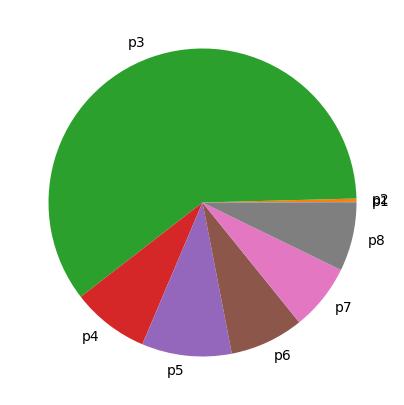

In [49]:
# create data
import matplotlib.pyplot as plt
plt.figure(figsize=(5,5))
names = ['p1','p2','p3','p4','p5','p6','p7','p8']
size = [p1,p2,p3,p4,p5,p6,p7,p8]
plt.pie(size, labels=names)
#plt.savefig('D:/Task/Zhao_lab/Zhujunjie/file/Fig/Fig4/Fig4-cell-pie.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')
plt.show()

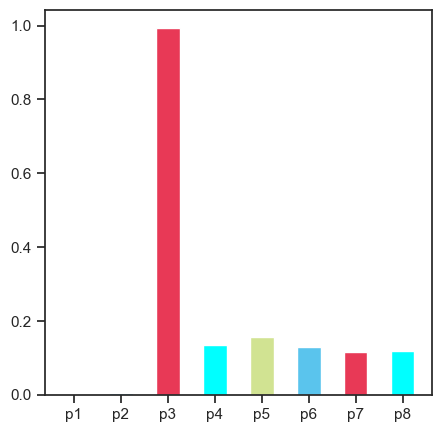

In [50]:
# libraries
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='ticks')
plt.figure(figsize=(5,5))
# create a dataset
height = [p1,p2,p3,p4,p5,p6,p7,p8]
bars = ['p1','p2','p3','p4','p5','p6','p7','p8']
x_pos = np.arange(len(bars))

# Create bars with different colors
plt.bar(x_pos, height, color=[ '#d1e392', '#5ac4ed', '#e83956', 'cyan'],width=0.5)

# Create names on the x-axis
plt.xticks(x_pos, bars)
plt.savefig(f'{run_name}/cell-percent.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')
#Show graph
plt.show()

In [51]:
height

[0.0009794319294809011,
 0.005876591576885406,
 0.9931439764936337,
 0.1341948310139165,
 0.15606361829025844,
 0.12823061630218688,
 0.11530815109343936,
 0.11928429423459244]

In [52]:
p1=sum((df_q05_cell_abundance_w_sf>1).sum(1)==1)/sum((df_q05_cell_abundance_w_sf>1).sum(1)>=1)

In [55]:
df_cell_count=pd.DataFrame((df_q05_cell_abundance_w_sf>x).sum(0)[df_q05_cell_abundance_w_sf.columns[(df_q05_cell_abundance_w_sf>x).sum(0)>250]])
df_cell_count.loc['other',0]=(df_q05_cell_abundance_w_sf>x).sum(0)[df_q05_cell_abundance_w_sf.columns[(df_q05_cell_abundance_w_sf>x).sum(0)<=250]].sum()
df_cell_count.index=[i.replace('q05cell_abundance_w_sf_','') for i in df_cell_count.index ]
df_cell_count.columns=['count']

In [56]:
df_cell_count.shape

(19, 1)

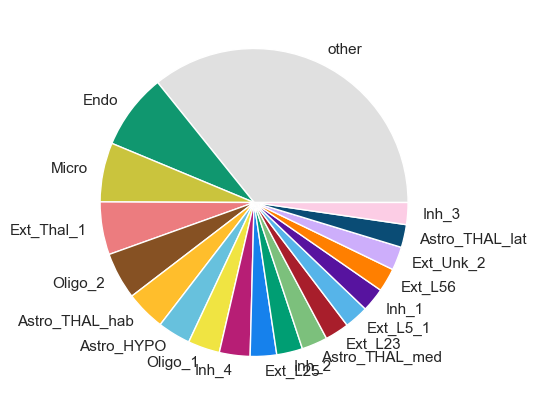

In [57]:
cmaps = [
    # --- 你原有的 15 种经典配色 ---
    '#e0e0e0', # 1. 浅灰 (推荐留给 'other' 或 背景)
    '#10976f', # 2. 深绿
    '#cac43d', # 3. 橄榄黄
    '#ec7c7f', # 4. 柔红
    '#865123', # 5. 棕色
    '#ffbe2c', # 6. 亮橙黄
    '#67c1dd', # 7. 浅蓝
    '#f0e442', # 8. 明黄
    '#b71e75', # 9. 紫红/洋红
    '#1681ec', # 10. 亮蓝
    '#009e73', # 11. 蓝绿/青色
    '#7cc07c', # 12. 浅绿
    '#a81e2b', # 13. 深红
    '#56b4e9', # 14. 天蓝
    '#57139f', # 15. 深紫
    
    # --- 补充的 12 种高对比度新色 ---
    '#ff7f00', # 16. 纯活力橙 (极强对比)
    '#cdaefb', # 17. 薰衣草淡紫
    '#0a4c75', # 18. 深海军蓝/藏青
    '#fccde5', # 19. 柔和茱萸粉
    # '#8dd3c7', # 20. 薄荷淡青绿
    # '#525252', # 21. 深木炭灰 (适合突变/基质特殊结构)
    # '#f4a582', # 22. 蜜桃/三文鱼色
    # '#800000', # 23. 勃艮第酒红
    # '#ccebc5', # 24. 极浅抹茶绿
    # '#c994c7', # 25. 丁香暗紫红
    # '#4a1486', # 26. 极暗黑紫
    # '#b15928'  # 27. 铁锈复古橘
]
df_cell_count=df_cell_count.sort_values('count',ascending=False)
df_cell_count['color']=cmaps
df_cell_count['cell_type']=df_cell_count.index
# create data
plt.figure(figsize=(5,5))
names = list(df_cell_count.index)
size = list(df_cell_count['count'])
plt.pie(size, labels=names,colors=list(df_cell_count['color']))
plt.savefig(f'{run_name}/celltype-percent.pdf', dpi = 300, transparent=True, format = 'pdf', bbox_inches='tight')
plt.show()

In [58]:
df_cell_count=df_cell_count.sort_values(['count'],ascending =False)
df_cell_count

,count,color,cell_type
other,4366.0,#e0e0e0,other
Endo,971.0,#10976f,Endo
Micro,758.0,#cac43d,Micro
Ext_Thal_1,676.0,#ec7c7f,Ext_Thal_1
Oligo_2,601.0,#865123,Oligo_2
Astro_THAL_hab,509.0,#ffbe2c,Astro_THAL_hab
Astro_HYPO,422.0,#67c1dd,Astro_HYPO
Oligo_1,408.0,#f0e442,Oligo_1
Inh_4,393.0,#b71e75,Inh_4
Ext_L25,338.0,#1681ec,Ext_L25


In [59]:
cell_type_list=list(adata_st.uns['mod']['factor_names'])
cell_type_list

['Astro_AMY',
 'Astro_AMY_CTX',
 'Astro_CTX',
 'Astro_HPC',
 'Astro_HYPO',
 'Astro_STR',
 'Astro_THAL_hab',
 'Astro_THAL_lat',
 'Astro_THAL_med',
 'Astro_WM',
 'Endo',
 'Ext_Amy_1',
 'Ext_Amy_2',
 'Ext_ClauPyr',
 'Ext_Hpc_CA1',
 'Ext_Hpc_CA2',
 'Ext_Hpc_CA3',
 'Ext_Hpc_DG1',
 'Ext_Hpc_DG2',
 'Ext_L5_1',
 'Ext_L5_2',
 'Ext_L5_3',
 'Ext_L6',
 'Ext_L6B',
 'Ext_L23',
 'Ext_L25',
 'Ext_L56',
 'Ext_Med',
 'Ext_Pir',
 'Ext_Thal_1',
 'Ext_Thal_2',
 'Ext_Unk_1',
 'Ext_Unk_2',
 'Ext_Unk_3',
 'Inh_1',
 'Inh_2',
 'Inh_3',
 'Inh_4',
 'Inh_5',
 'Inh_6',
 'Inh_Lamp5',
 'Inh_Meis2_1',
 'Inh_Meis2_2',
 'Inh_Meis2_3',
 'Inh_Meis2_4',
 'Inh_Pvalb',
 'Inh_Sst',
 'Inh_Vip',
 'Micro',
 'Nb_1',
 'Nb_2',
 'OPC_1',
 'OPC_2',
 'Oligo_1',
 'Oligo_2']

In [60]:
df_cell_count=pd.DataFrame((df_q05_cell_abundance_w_sf>x).sum(0))
df_cell_count.index=[i.replace('q05cell_abundance_w_sf_','') for i in df_cell_count.index ]
df_cell_count.columns=['count']
df_cell_count=df_cell_count.sort_values(['count'],ascending =False)

In [61]:
cmaps_30 = [
    # --- 第 1 梯队：你原有的 15 种经典配色 ---
    '#10976f', # 2. 深绿
    '#cac43d', # 3. 橄榄黄
    '#ec7c7f', # 4. 柔红
    '#865123', # 5. 棕色
    '#ffbe2c', # 6. 亮橙黄
    '#67c1dd', # 7. 浅蓝
    '#f0e442', # 8. 明黄
    '#b71e75', # 9. 紫红/洋红
    '#1681ec', # 10. 亮蓝
    '#009e73', # 11. 蓝绿/青色
    '#7cc07c', # 12. 浅绿
    '#a81e2b', # 13. 深红
    '#56b4e9', # 14. 天蓝
    '#57139f', # 15. 深紫
    
    # --- 第 2 梯队：为暗场优化的 15 种高亮补充色 ---
    '#ff7f00', # 16. 纯正活力橙 (极强对比)
    '#cdaefb', # 17. 亮薰衣草紫
    '#39ff14', # 18. 荧光霓虹绿 (在黑底上极为耀眼)
    '#fccde5', # 19. 柔和茱萸粉
    '#00ced1', # 20. 亮明亮青/绿松石色
    '#ff1493', # 21. 荧光深粉色 (Deep Pink)
    '#f4a582', # 22. 蜜桃/三文鱼色
    '#8dd3c7', # 23. 薄荷淡青绿
    '#ccebc5', # 24. 极浅抹茶绿
    '#c994c7', # 25. 丁香暗紫红
    '#b2df8a', # 26. 苹果亮绿
    '#fb9a99', # 27. 玫瑰浅红
    '#fdbf6f', # 28. 明亮奶油橘
    '#cab2d6', # 29. 浅灰紫
    '#ffff99',  # 30. 极亮荧光黄
    '#e0e0e0', # 1. 浅灰 (如果是 other 兜底，用灰色最合适)
]

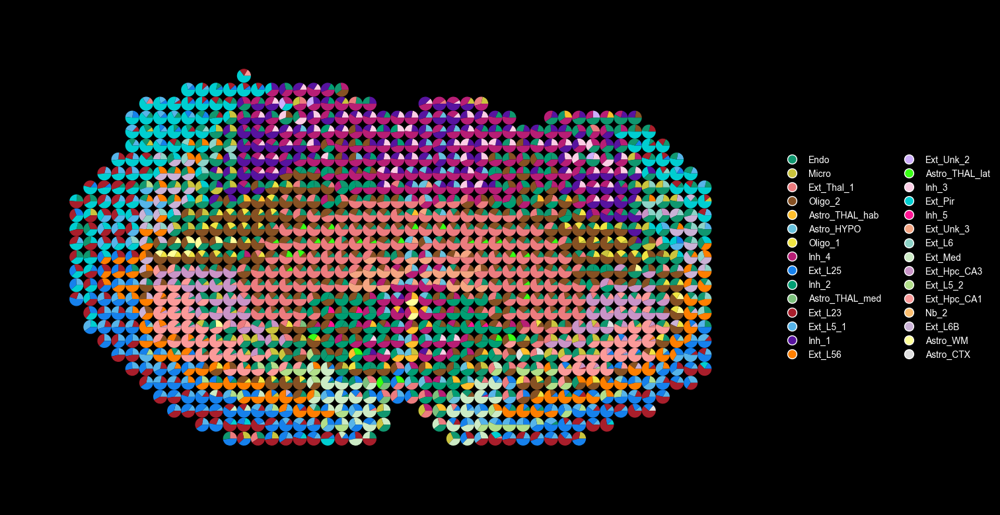

In [62]:
top_30_labels = list(df_cell_count.index[:30])
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Wedge

def plot_spatial_pie_charts_top3(adata, cell_types, colors, spot_size=0.5, min_total_threshold=0.1):
    """
    adata: 空间数据对象
    cell_types: 全局 Top 30 细胞列表
    colors: 30 色调色盘
    spot_size: 饼图半径
    min_total_threshold: 总丰度门槛
    """
    coords = adata.obsm['spatial']
    x_coords, y_coords = coords[:, 0], -coords[:, 1] 
    
    # 提取 Top 30 的丰度数据
    data = adata.obs[cell_types].values
    n_spots = len(adata)
    
    # 🌟 用来记录哪些细胞类型真正出现在了 Top 3 中
    used_indices = set()
    
    fig, ax = plt.subplots(figsize=(15, 12), facecolor='black')
    ax.set_facecolor('black')

    for i in range(n_spots):
        spot_data = data[i, :].copy()
        total_abundance = np.sum(spot_data)
        
        # 1. 门槛检查
        if total_abundance < min_total_threshold:
            continue
            
        # 2. 🌟 核心逻辑：找出当前点丰度最高的前 3 名
        # argsort 得到从小到大的索引，取最后 3 个即为最大值索引
        top_indices = np.argsort(spot_data)[-3:]
        
        # 只保留这 3 个值，其余全部清零
        # 注意：如果某个细胞丰度为 0，即便是前三也不要
        top_indices = [idx for idx in top_indices if spot_data[idx] > 0]
        
        if len(top_indices) == 0:
            continue
            
        # 提取这前三名的丰度并归一化（让它们拼成一个完整的圆）
        final_ratios = spot_data[top_indices] / np.sum(spot_data[top_indices])
        
        # 记录这些细胞已被使用，用于后续构建图例
        used_indices.update(top_indices)
        
        # 3. 绘制饼图
        starts = 0
        for idx_in_top, ratio in zip(top_indices, final_ratios):
            extent = 360 * ratio
            w = Wedge(center=(x_coords[i], y_coords[i]), r=spot_size, 
                      theta1=starts, theta2=starts + extent, 
                      # 注意：这里的颜色要对应它在原始 top_30_labels 中的索引
                      facecolor=colors[idx_in_top % len(colors)], 
                      edgecolor='none', antialiased=True)
            ax.add_patch(w)
            starts += extent

    # 设置坐标轴范围
    ax.set_xlim(x_coords.min() - spot_size*10, x_coords.max() + spot_size*10)
    ax.set_ylim(y_coords.min() - spot_size*10, y_coords.max() + spot_size*10)

    # 4. 🌟 动态构建图例：只显示出现在图中（used_indices）的细胞
    # 按原始顺序排序，保证图例整齐
    sorted_used_indices = sorted(list(used_indices))
    
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', label=cell_types[idx],
               markerfacecolor=colors[idx % len(colors)], markersize=10, lw=0)
        for idx in sorted_used_indices
    ]
    
    ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, 0.5),
              ncol=2, facecolor='black', edgecolor='none', labelcolor='white', fontsize=10)

    ax.set_aspect('equal')
    ax.axis('off')
    return fig, ax

# --- 执行绘图 ---

fig, ax = plot_spatial_pie_charts_top3(
    adata=adata_st, 
    cell_types=top_30_labels, 
    colors=cmaps_30, 
    spot_size=0.5,          # 50um 分辨率/2500点，这个值通常在 50-100 之间
    min_total_threshold=0.1
)

plt.savefig(f'{run_name}/spatial_pie_top3_filtered.pdf', dpi=300, facecolor='black', bbox_inches='tight')
plt.show()

In [63]:
cmaps_48 = [
    # --- 第 1 组：经典与明亮色 (1-16) ---
    '#e0e0e0', '#10976f', '#cac43d', '#ec7c7f', '#865123', '#ffbe2c', '#67c1dd', '#f0e442',
    '#b71e75', '#1681ec', '#009e73', '#7cc07c', '#a81e2b', '#56b4e9', '#57139f', '#ff7f00',
    
    # --- 第 2 组：霓虹与荧光色 (17-32) ---
    '#39ff14', '#ff1493', '#00ced1', '#fccde5', '#cdaefb', '#f4a582', '#8dd3c7', '#ffff99',
    '#bebada', '#fb8072', '#80b1d3', '#fdb462', '#b3de69', '#fccde5', '#d9d9d9', '#bc80bd',
    
    # --- 第 3 组：深色与高饱和补充色 (33-48) ---
    '#ccebc5', '#ffed6f', '#1f78b4', '#33a02c', '#fb9a99', '#e31a1c', '#fdbf6f', '#ff7f00',
    '#cab2d6', '#6a3d9a', '#ffff99', '#b15928', '#a6cee3', '#b2df8a', '#fb9a99', '#fdbf6f'
]

总共有 55 种细胞，但只有 35 种在切片中拿到了第一名。


C:\Users\Zhao Lab\AppData\Local\Temp\ipykernel_103864\1330606741.py:23: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


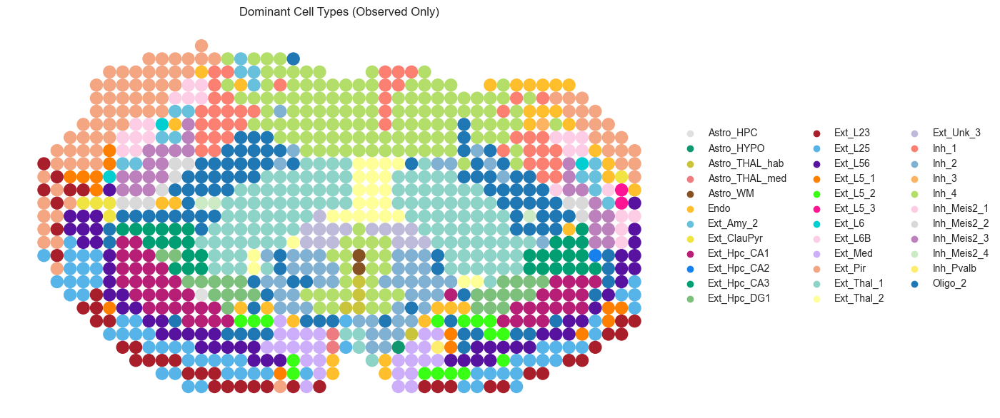

<Figure size 640x480 with 0 Axes>

In [64]:
import matplotlib.pyplot as plt

# 1. 提取所有 55 种细胞名称
all_cell_types = list(adata_st.uns['mod']['factor_names'])

# 2. 找出每个点的冠军细胞
# idxmax 返回数值最大的列名
raw_winners = adata_st.obs[all_cell_types].idxmax(axis=1)

# 3. 🌟 关键步骤：只保留真正出现在图中的细胞类型
# 将其转换为分类变量，并使用 .remove_unused_categories()
adata_st.obs['winner_type'] = pd.Categorical(raw_winners)
adata_st.obs['winner_type'] = adata_st.obs['winner_type'].cat.remove_unused_categories()

# 4. 获取真正出现的细胞数量，动态匹配颜色
present_cells = adata_st.obs['winner_type'].cat.categories
num_present = len(present_cells)
print(f"总共有 55 种细胞，但只有 {num_present} 种在切片中拿到了第一名。")

# 6. 绘图
# Scanpy 会自动只为 'winner_type' 中存在的分类显示图例
with plt.rc_context({'figure.figsize': (12, 10)}):
    sc.pl.spatial(
        adata_st,
        color='winner_type',
        palette=cmaps_48,
        size=1,
        linewidths=0,
        frameon=False,
        img_key=None,
        title='Dominant Cell Types (Observed Only)',
        legend_fontsize='small'
    )

# 保存图片
plt.savefig(f'{run_name}/observed_winner_map.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [65]:
import numpy as np
import pandas as pd

# 1. 获取结果 DataFrame
df_res = adata_st.obsm['q05_cell_abundance_w_sf']

# --- 2. 定义分类关键词 (这里不需要前缀了) ---
neuron_keys = ('Ext_', 'Inh_', 'Nb_') 
glia_keys = ('Astro_', 'Oligo_', 'OPC_', 'Micro')
vessel_keys = ('Endo')

# --- 3. 修正后的筛选逻辑：先去掉长前缀再检查开头 ---
prefix_to_remove = 'q05cell_abundance_w_sf_'

selected_neurons = [
    c for c in df_res.columns 
    if c.replace(prefix_to_remove, '').startswith(neuron_keys)
]
selected_glia = [
    c for c in df_res.columns 
    if c.replace(prefix_to_remove, '').startswith(glia_keys)
]
selected_vessels = [
    c for c in df_res.columns 
    if c.replace(prefix_to_remove, '').startswith(vessel_keys)
]

# --- 4. 剩下的计算逻辑保持不变 ---
adata_st.obs['Total_Neurons'] = df_res[selected_neurons].sum(axis=1).values
adata_st.obs['Total_Glia'] = df_res[selected_glia].sum(axis=1).values
adata_st.obs['Total_Vessels'] = df_res[selected_vessels].sum(axis=1).values

def process_for_plot(series):
    log_v = np.log1p(series)
    if (log_v.max() - log_v.min()) > 0:
        return (log_v - log_v.min()) / (log_v.max() - log_v.min())
    return 0

adata_st.obs['Neurons_plot'] = process_for_plot(adata_st.obs['Total_Neurons'])
adata_st.obs['Glia_plot'] = process_for_plot(adata_st.obs['Total_Glia'])
adata_st.obs['Vessels_plot'] = process_for_plot(adata_st.obs['Total_Vessels'])

# --- 5. 打印确认 ---
print(f"✅ 再次修正完成！")
print(f"📊 神经元: 合并 {len(selected_neurons)} 种")
print(f"📊 胶质细胞: 合并 {len(selected_glia)} 种")
print(f"📊 血管细胞: 合并 {len(selected_vessels)} 种")

✅ 再次修正完成！
📊 神经元: 合并 39 种
📊 胶质细胞: 合并 15 种
📊 血管细胞: 合并 1 种


In [66]:
import numpy as np
import pandas as pd

# 1. 获取结果 DataFrame
df_res = adata_st.obsm['q05_cell_abundance_w_sf']
prefix_to_remove = 'q05cell_abundance_w_sf_'

# --- 2. 定义更精细的功能分类关键词 ---
# 激活/兴奋性 (Activating/Excitatory)
excitatory_keys = ('Ext_') 

# 抑制性 (Inhibitory)
inhibitory_keys = ('Inh_')

# 发育中/神经母细胞 (Neuroblasts - 可选)
nb_keys = ('Nb_')

# 胶质与血管保持不变
glia_keys = ('Astro_', 'Oligo_', 'OPC_', 'Micro')
vessel_keys = ('Endo')

# --- 3. 筛选逻辑 ---
selected_excitatory = [c for c in df_res.columns if c.replace(prefix_to_remove, '').startswith(excitatory_keys)]
selected_inhibitory = [c for c in df_res.columns if c.replace(prefix_to_remove, '').startswith(inhibitory_keys)]
selected_nb = [c for c in df_res.columns if c.replace(prefix_to_remove, '').startswith(nb_keys)]
selected_glia = [c for c in df_res.columns if c.replace(prefix_to_remove, '').startswith(glia_keys)]

# --- 4. 计算总和 ---
adata_st.obs['Total_Excitatory'] = df_res[selected_excitatory].sum(axis=1).values
adata_st.obs['Total_Inhibitory'] = df_res[selected_inhibitory].sum(axis=1).values
adata_st.obs['Total_Glia'] = df_res[selected_glia].sum(axis=1).values

# --- 5. Log + 归一化处理函数 (带开关逻辑的简化版) ---
def process_for_plot(series, do_log=True, do_norm=True):
    vals = series.values
    if do_log:
        vals = np.log1p(vals)
    if do_norm:
        v_min, v_max = vals.min(), vals.max()
        if v_max - v_min > 0:
            vals = (vals - v_min) / (v_max - v_min)
        else:
            vals = np.zeros_like(vals)
    return vals

# 生成绘图列
adata_st.obs['Excitatory_plot'] = process_for_plot(adata_st.obs['Total_Excitatory'])
adata_st.obs['Inhibitory_plot'] = process_for_plot(adata_st.obs['Total_Inhibitory'])
adata_st.obs['Glia_plot'] = process_for_plot(adata_st.obs['Total_Glia'])

# --- 6. 打印确认 ---
print(f"✅ 神经元功能分类完成！")
print(f"🔥 激活/兴奋性 (Excitatory): 合并 {len(selected_excitatory)} 种")
print(f"❄️ 抑制性 (Inhibitory): 合并 {len(selected_inhibitory)} 种")
print(f"🧠 胶质细胞 (Glia): 合并 {len(selected_glia)} 种")

✅ 神经元功能分类完成！
🔥 激活/兴奋性 (Excitatory): 合并 23 种
❄️ 抑制性 (Inhibitory): 合并 14 种
🧠 胶质细胞 (Glia): 合并 15 种


🚀 当前模式: Log=False, Normalize=False


C:\Users\Zhao Lab\AppData\Local\Temp\ipykernel_103864\1300408561.py:48: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


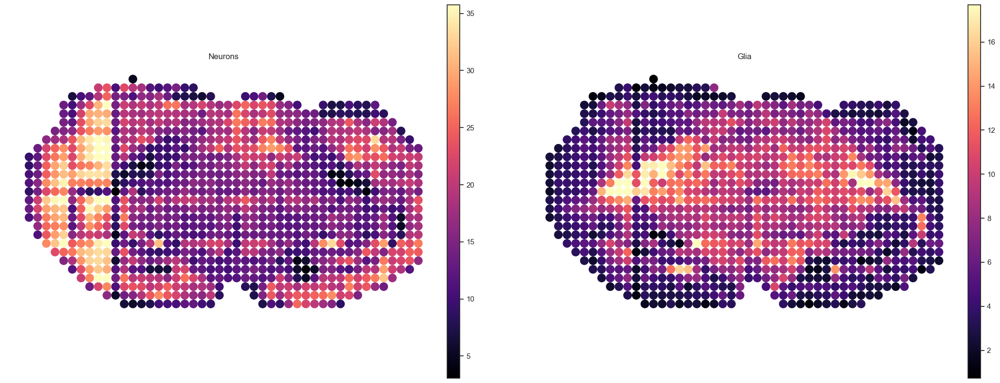

In [67]:
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt

# ================= 调色台开关 =================
do_log = False        # True: 执行 log1p 变换 | False: 保持线性刻度
do_normalize = False  # True: 执行 0-1 归一化 | False: 保持原始数值量级
# =============================================

target_cols = ['Total_Neurons', 'Total_Glia']
plot_keys = []
titles = []

for col in target_cols:
    # 1. 提取原始数据
    vals = adata_st.obs[col].values.copy()
    suffix = ""
    
    # 2. Log 变换开关
    if do_log:
        vals = np.log1p(vals)
        suffix += "_log"
        
    # 3. 归一化开关
    if do_normalize:
        v_min, v_max = vals.min(), vals.max()
        if v_max - v_min > 0:
            vals = (vals - v_min) / (v_max - v_min)
        else:
            vals = np.zeros_like(vals)
        suffix += "_norm"
    
    # 如果全关，标记为 raw
    if not suffix: suffix = "_raw"
    
    # 4. 写入 adata 并生成标题
    col_name = f"{col}{suffix}"
    adata_st.obs[col_name] = vals
    plot_keys.append(col_name)
    
    # 生成描述性标题
    titles.append(f"{col.split('_')[-1]}")

print(f"🚀 当前模式: Log={do_log}, Normalize={do_normalize}")

# 5. 绘图
with plt.rc_context({'figure.figsize': (12, 10), 'axes.facecolor': 'black'}):
    sc.pl.spatial(
        adata_st,
        color=plot_keys,
        cmap='magma',
        size=1,
        linewidths=0,
        ncols=2,
        # 归一化时固定 0-1，不归一化时使用 p99 压制离群值防止画面过暗
        vmin=0 if do_normalize else None,
        vmax=1.0 if do_normalize else 'p99', 
        frameon=False,
        img_key=None,
        title=titles
    )

plt.show()

C:\Users\Zhao Lab\AppData\Local\Temp\ipykernel_103864\1669442335.py:5: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


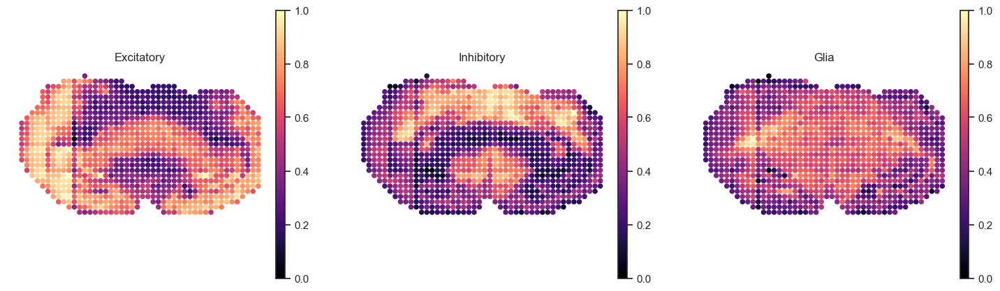

In [68]:
import scanpy as sc
import matplotlib.pyplot as plt

with plt.rc_context({'figure.figsize': (5, 5), 'axes.facecolor': 'black'}):
    sc.pl.spatial(
        adata_st,
        color=['Excitatory_plot', 'Inhibitory_plot', 'Glia_plot'],
        cmap='magma',
        size=1,
        linewidths=0,
        ncols=3,
        frameon=False,
        img_key=None,
        title=['Excitatory', 'Inhibitory', 'Glia']
    )

In [69]:
all_cell_types

['Astro_AMY',
 'Astro_AMY_CTX',
 'Astro_CTX',
 'Astro_HPC',
 'Astro_HYPO',
 'Astro_STR',
 'Astro_THAL_hab',
 'Astro_THAL_lat',
 'Astro_THAL_med',
 'Astro_WM',
 'Endo',
 'Ext_Amy_1',
 'Ext_Amy_2',
 'Ext_ClauPyr',
 'Ext_Hpc_CA1',
 'Ext_Hpc_CA2',
 'Ext_Hpc_CA3',
 'Ext_Hpc_DG1',
 'Ext_Hpc_DG2',
 'Ext_L5_1',
 'Ext_L5_2',
 'Ext_L5_3',
 'Ext_L6',
 'Ext_L6B',
 'Ext_L23',
 'Ext_L25',
 'Ext_L56',
 'Ext_Med',
 'Ext_Pir',
 'Ext_Thal_1',
 'Ext_Thal_2',
 'Ext_Unk_1',
 'Ext_Unk_2',
 'Ext_Unk_3',
 'Inh_1',
 'Inh_2',
 'Inh_3',
 'Inh_4',
 'Inh_5',
 'Inh_6',
 'Inh_Lamp5',
 'Inh_Meis2_1',
 'Inh_Meis2_2',
 'Inh_Meis2_3',
 'Inh_Meis2_4',
 'Inh_Pvalb',
 'Inh_Sst',
 'Inh_Vip',
 'Micro',
 'Nb_1',
 'Nb_2',
 'OPC_1',
 'OPC_2',
 'Oligo_1',
 'Oligo_2']

计算得到全局统一色标最大值 (Log后): 3.078
✅ 处理完成，按【原始顺序】准备了 55 个图层。


C:\Users\Zhao Lab\AppData\Local\Temp\ipykernel_103864\2174300753.py:30: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata_st.obs[plot_key] = log_v
C:\Users\Zhao Lab\AppData\Local\Temp\ipykernel_103864\2174300753.py:30: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata_st.obs[plot_key] = log_v
C:\Users\Zhao Lab\AppData\Local\Temp\ipykernel_103864\2174300753.py:30: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining 

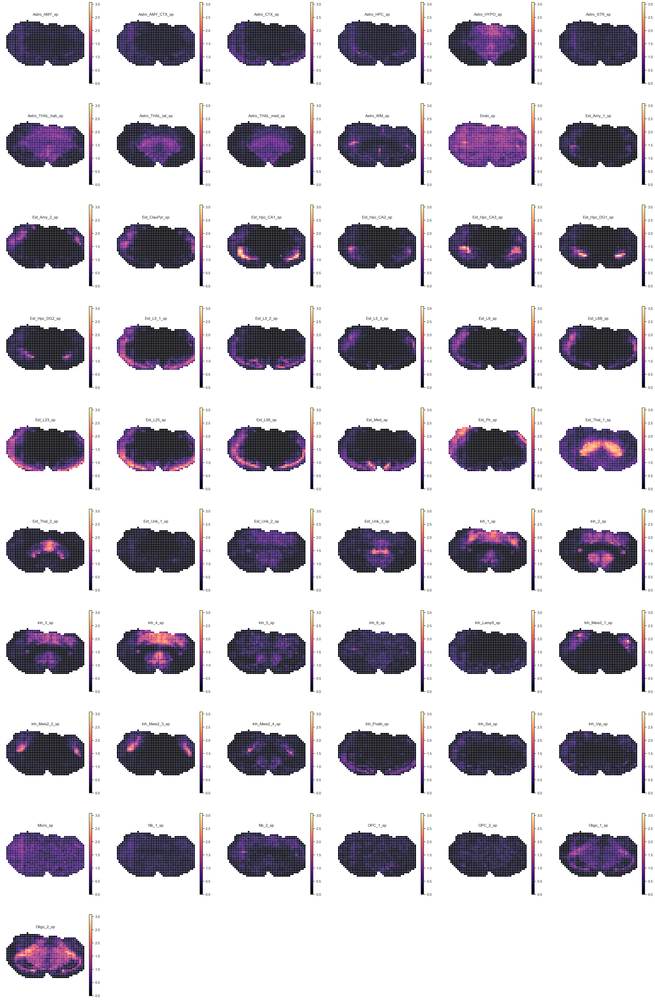

In [70]:
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt

# 1. 准备数据
df_res = adata_st.obsm['q05_cell_abundance_w_sf']
prefix_to_remove = 'q05cell_abundance_w_sf_'

# --- 恢复：直接使用原始的列名顺序 ---
original_cell_names = df_res.columns.tolist()

# --- 保留：计算全局统一的 vmax ---
# 取全部数据的 99.5% 分位数作为全局最大值，防止极个别点过亮
all_log_vals = np.log1p(df_res.values)
global_vmax = np.percentile(all_log_vals, 100)

print(f"计算得到全局统一色标最大值 (Log后): {global_vmax:.3f}")

# 2. 存入 adata.obs
all_processed_keys = []

for col in original_cell_names:
    # 仅执行 Log 变换压缩动态范围
    log_v = np.log1p(df_res[col].values)
    
    # 生成新列名 (去掉前缀)
    short_name = col.replace(prefix_to_remove, '')
    plot_key = f"{short_name}_sp"
    
    adata_st.obs[plot_key] = log_v
    all_processed_keys.append(plot_key)

print(f"✅ 处理完成，按【原始顺序】准备了 {len(all_processed_keys)} 个图层。")

# 3. 绘制全景大图
with plt.rc_context({'figure.figsize': (5,5), 'axes.facecolor': 'black'}):
    sc.pl.spatial(
        adata_st,
        color=all_processed_keys, # 使用原始排序的 keys
        cmap='magma',
        size=1.05,
        linewidths=0,
        ncols=6,            # 每行画 6 个
        frameon=False,
        img_key=None,
        vmin=0, 
        vmax=global_vmax,   # 🌟 核心：继续强制所有子图使用同一个最大值
        show=True
    )

C:\Users\Zhao Lab\AppData\Local\Temp\ipykernel_103864\4259778333.py:72: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


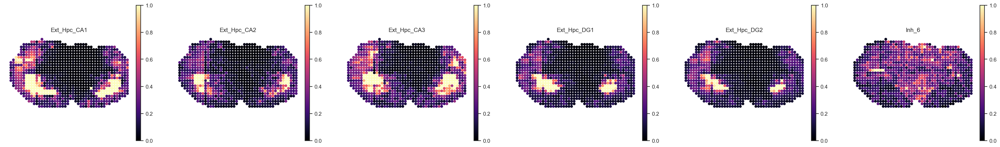

In [71]:
import matplotlib.pyplot as plt
import scanpy as sc

# ==========================================
# 1. 在这里的数组中输入你想看的细胞名字 
# （记得带上 _sp 后缀，可以随意增减）
# ==========================================
my_selected_cells = [
#  'Astro_AMY',
#  'Astro_AMY_CTX',
#  'Astro_CTX',
#  'Astro_HPC',
#  'Astro_HYPO',
#  'Astro_STR',
#  'Astro_THAL_hab',
#  'Astro_THAL_lat',
#  'Astro_THAL_med',
#  'Astro_WM',
#  'Endo',
#  'Ext_Amy_1',
#  'Ext_Amy_2',
#  'Ext_ClauPyr',
 'Ext_Hpc_CA1',
 'Ext_Hpc_CA2',
 'Ext_Hpc_CA3',
 'Ext_Hpc_DG1',
 'Ext_Hpc_DG2',
#  'Ext_L5_1',
#  'Ext_L5_2',
#  'Ext_L5_3',
#  'Ext_L6',
#  'Ext_L6B',
#  'Ext_L23',
#  'Ext_L25',
#  'Ext_L56',
#  'Ext_Med',
#  'Ext_Pir',
#  'Ext_Thal_1',
#  'Ext_Thal_2',
#  'Ext_Unk_1',
#  'Ext_Unk_2',
#  'Ext_Unk_3',
#  'Inh_1',
#  'Inh_2',
#  'Inh_3',
#  'Inh_4',
#  'Inh_5',
 'Inh_6',
#  'Inh_Lamp5',
#  'Inh_Meis2_1',
#  'Inh_Meis2_2',
#  'Inh_Meis2_3',
#  'Inh_Meis2_4',
#  'Inh_Pvalb',
#  'Inh_Sst',
#  'Inh_Vip',
#  'Micro',
#  'Nb_1',
#  'Nb_2',
#  'OPC_1',
#  'OPC_2',
#  'Oligo_1',
#  'Oligo_2'
 ]

# 2. 动态计算排版：根据你输入的细胞数量，自动决定画几列 (最多 4 列)
n_cols = min(6, len(my_selected_cells))
n_rows = (len(my_selected_cells) + n_cols - 1) // n_cols  # 向上取整算行数

# 3. 绘图 (继续保持全局统一色标 global_vmax)
with plt.rc_context({'figure.figsize': (5,5), 'axes.facecolor': 'black'}):
    sc.pl.spatial(
        adata_st,
        color=my_selected_cells,
        cmap='magma',
        size=1.05,
        linewidths=0,
        ncols=n_cols,
        frameon=False,
        img_key=None,
        vmin=0, 
        vmax=1,  # 🌟 保持低丰度细胞的真实亮度
        show=True
    )

In [30]:
my_selected_cells = [
#  'Astro_AMY',
#  'Astro_AMY_CTX',
#  'Astro_CTX',
#  'Astro_HPC',
#  'Astro_HYPO',
#  'Astro_STR',
#  'Astro_THAL_hab',
#  'Astro_THAL_lat',
#  'Astro_THAL_med',
#  'Astro_WM',
#  'Endo',
#  'Ext_Amy_1',
#  'Ext_Amy_2',
#  'Ext_ClauPyr',
 'Ext_Hpc_CA1',
 'Ext_Hpc_CA2',
 'Ext_Hpc_CA3',
 'Ext_Hpc_DG1',
#  'Ext_Hpc_DG2',
 'Ext_L5_1',
 'Ext_L5_2',
 'Ext_L5_3',
 'Ext_L6',
 'Ext_L6B',
 'Ext_L23',
 'Ext_L25',
 'Ext_L56',
#  'Ext_Med',
#  'Ext_Pir',
 'Ext_Thal_1',
 'Ext_Thal_2',
#  'Ext_Unk_1',
#  'Ext_Unk_2',
#  'Ext_Unk_3',
#  'Inh_1',
#  'Inh_2',
#  'Inh_3',
#  'Inh_4',
#  'Inh_5',
#  'Inh_6',
#  'Inh_Lamp5',
#  'Inh_Meis2_1',
#  'Inh_Meis2_2',
#  'Inh_Meis2_3',
#  'Inh_Meis2_4',
#  'Inh_Pvalb',
#  'Inh_Sst',
#  'Inh_Vip',
#  'Micro',
#  'Nb_1',
#  'Nb_2',
#  'OPC_1',
#  'OPC_2',
#  'Oligo_1',
#  'Oligo_2'
 ]

In [75]:
my_selected_cells = [
#  'Endo',
 'Ext_Hpc_CA1',
 'Ext_Hpc_CA2',
 'Ext_Hpc_CA3',
 'Ext_Hpc_DG1',
 'Ext_L5_1',
 'Ext_L5_2',
 'Ext_L6',
 'Ext_L6B',
 'Ext_L23',
 'Ext_L25',
 'Ext_L56',
 'Ext_Amy_2',
 'Ext_Pir',
 'Ext_Thal_1',
 'Ext_Thal_2',
 'Inh_1',
 'Inh_4',
 'Inh_5',
 'Inh_6',
 'Inh_Meis2_3',
 'Inh_Meis2_4',
 'Oligo_1',
 'Oligo_2',
 'Micro',
 ]

In [93]:
adata_st.obs

,sample,col,row,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,...,Inh_Pvalb_sp,Inh_Sst_sp,Inh_Vip_sp,Micro_sp,Nb_1_sp,Nb_2_sp,OPC_1_sp,OPC_2_sp,Oligo_1_sp,Oligo_2_sp
AAAGCGTGAACCGCGG,WJ05072,1,46,849,6.745236,1696,7.436617,38.325472,48.054245,60.200472,...,0.006860,0.012329,0.012654,0.180712,0.099991,0.486360,0.027398,0.080996,0.039210,0.066551
AAAGCGTGAACCTGTT,WJ05072,50,46,2572,7.852828,8955,9.100079,51.937465,57.219430,63.305416,...,0.012913,0.021945,0.027433,0.086710,0.191713,0.335336,0.090153,0.051030,0.041314,0.082196
AAAGCGTGAAGGTACC,WJ05072,21,46,1101,7.004882,2373,7.772332,39.823009,48.419722,58.702065,...,0.006571,0.015484,0.010132,0.098810,0.140476,0.317572,0.248287,0.138877,0.216431,0.259860
AAAGCGTGAATTCTGC,WJ05072,23,46,1104,7.007601,2189,7.691657,35.312928,44.266788,55.093650,...,0.008450,0.010346,0.013272,0.069935,0.146663,0.505909,0.037438,0.083171,0.144015,0.128434
AAAGCGTGACCACTTA,WJ05072,38,46,968,6.876265,2176,7.685703,42.279412,51.056985,61.718750,...,0.011969,0.012396,0.014051,0.457882,0.092074,0.209638,0.025459,0.029199,0.036740,0.094427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGGTGAGTGCATTGC,WJ05072,45,36,1543,7.342132,4230,8.350194,40.401891,49.598109,60.236407,...,0.029376,0.023027,0.056721,0.088690,0.106266,0.248308,0.024553,0.025233,0.087640,0.216563
TTGGTGAGTGTCGTAG,WJ05072,37,36,1789,7.489971,4930,8.503297,43.894523,51.318458,59.269777,...,0.002288,0.003138,0.004204,0.203141,0.056920,0.532320,0.025026,0.038267,0.133977,0.175616
TTGGTGAGTTCAGGTC,WJ05072,10,36,1918,7.559559,4640,8.442685,34.504310,42.456897,52.155172,...,0.009096,0.006501,0.012444,0.058026,0.072238,0.194294,0.028438,0.050825,0.334293,0.190233
TTGGTGAGTTCTAACG,WJ05072,33,36,614,6.421622,1503,7.315884,57.351963,64.737192,72.455090,...,0.003693,0.003812,0.006246,0.039063,0.051004,0.268195,0.008846,0.073504,0.221477,0.834512


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

# ================= 调参区 =================
# 🌟 新增：过滤阈值 (0.2 代表低于最高亮度 20% 的信号将被抹除)
signal_threshold = 0.02
# ==========================================

# 1. 提取数据
keys_to_plot = [f"{cell}_sp" for cell in my_selected_cells]
val_matrix = adata_st.obs[keys_to_plot].values 

# 2. 归一化发光强度
intensity_matrix = np.clip(val_matrix / global_vmax, 0, 1)

# 🌟 核心过滤逻辑：将低于 20% 的强度强制设为 0 (完全不发光)
intensity_matrix[intensity_matrix < signal_threshold] = 0

# 3. 定义一套高对比度的“荧光基础色” 
base_hex_colors = [
    "#E6194B", # 红色
    "#3CB44B", # 绿色
    "#FFE119", # 黄色
    "#4363D8", # 蓝色
    "#F58231", # 橙色
    "#911EB4", # 紫色
    "#42D4F4", # 青色
    "#F032E6", # 洋红
    "#BFEF45", # 荧光绿
    "#FABEBE", # 浅粉
    "#469990", # 蓝绿色 (Teal)
    "#E6BEFF", # 薰衣草紫
    "#9A6324", # 棕色
    "#FFFAC8", # 米黄色
    "#800000", # 栗色
    "#AAFFC3", # 薄荷绿
    "#808000", # 橄榄绿
    "#FFD8B1", # 杏红色
    "#000075", # 海军蓝
    "#A9A9A9", # 灰色
    "#FF7F00", # 深橙色
    "#6A3D9A", # 深紫色
    "#B15928", # 赭石色
    "#1F78B4"  # 海洋蓝
]
base_rgbs = [mcolors.to_rgb(c) for c in base_hex_colors]

# 4. RGB 颜色加法混合
n_spots = intensity_matrix.shape[0]
final_colors = np.zeros((n_spots, 3))

for i in range(len(keys_to_plot)):
    color_idx = i % len(base_rgbs)
    r, g, b = base_rgbs[color_idx]
    
    final_colors[:, 0] += intensity_matrix[:, i] * r
    final_colors[:, 1] += intensity_matrix[:, i] * g
    final_colors[:, 2] += intensity_matrix[:, i] * b

final_colors = np.clip(final_colors, 0, 1)

# 5. 提取空间坐标
coords = adata_st.obsm['spatial']
x = coords[:, 0]
y = coords[:, 1]

# 6. 开始绘制“发光图”
fig, ax = plt.subplots(figsize=(10, 10), facecolor='black')
ax.set_facecolor('black')

# 绘制散点 (增加 marker='s' 将形状改为正方形)
scatter = ax.scatter(x, y, c=final_colors, s=80, 
                    #  marker='s', 
                     edgecolors='none')

# 反转 Y 轴
ax.invert_yaxis()
ax.set_aspect('equal')
ax.axis('off')

# 7. 制作图例
legend_patches = []
for i, cell_name in enumerate(my_selected_cells):
    color_idx = i % len(base_rgbs)
    patch = mpatches.Patch(color=base_hex_colors[color_idx], label=cell_name)
    legend_patches.append(patch)

ax.legend(handles=legend_patches, loc='center left', bbox_to_anchor=(1.02, 0.5),
          facecolor='black', edgecolor='none', labelcolor='white', fontsize=12,
          title=f"Cell Types (Threshold > {signal_threshold*100}%)", 
          title_fontsize=14).get_title().set_color('white')

plt.title("Multiplexed Spatial Distribution (Denoised)", color='white', fontsize=16, pad=20)
plt.show()

In [86]:
my_selected_cells = [
#  'Endo',
 'Ext_Hpc_CA1',
 'Ext_Hpc_CA2',
 'Ext_Hpc_CA3',
 'Ext_Hpc_DG1',
 'Ext_L5_1',
 'Ext_L5_2',
 'Ext_L6',
 'Ext_L6B',
 'Ext_L23',
 'Ext_L25',
 'Ext_L56',
 'Ext_Amy_2',
 'Ext_Pir',
 'Ext_Thal_1',
 'Ext_Thal_2',
 'Inh_1',
 'Inh_4',
 'Inh_5',
 'Inh_6',
 'Inh_Meis2_3',
 'Inh_Meis2_4',
 'Oligo_1',
 'Oligo_2',
 'Micro',
 ]

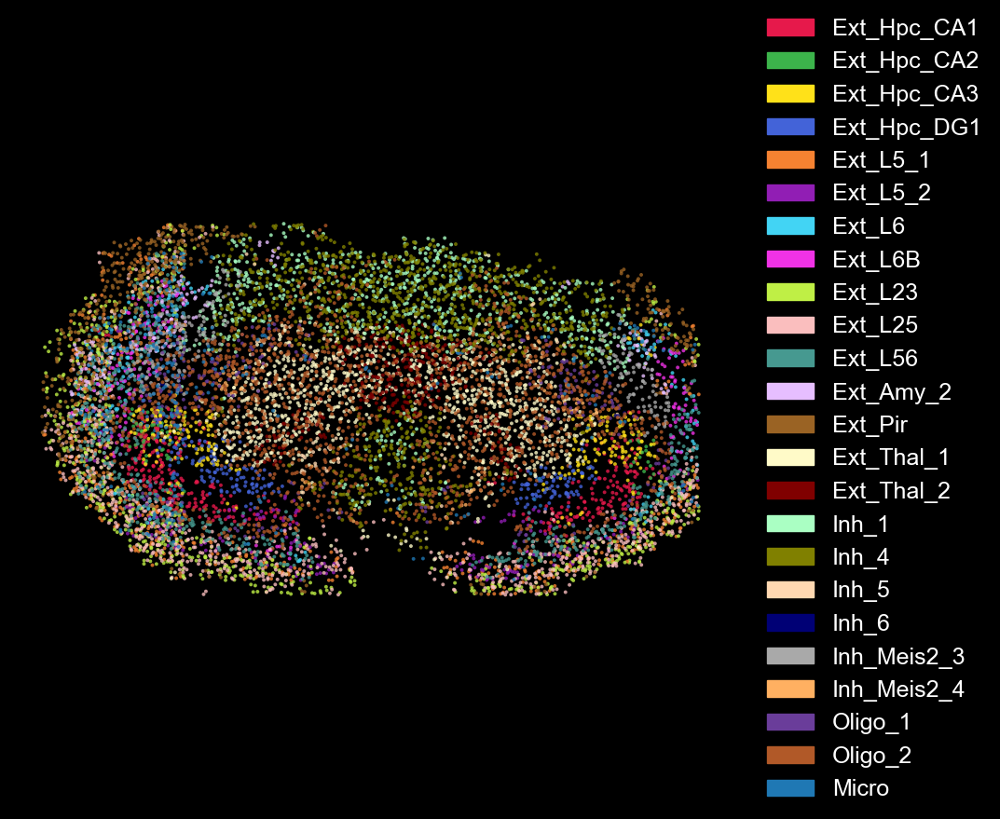

In [92]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from scipy.spatial.distance import pdist

# ================= 调参区 =================
# 🌟 过滤阈值 (0.00 代表不进行底层过滤)
signal_threshold = 0.25

# 🌟 新增：散点图专属参数
max_dots_per_spot = 30  # 【修改点】现在可以填任意大小的数字了！代表最高丰度时撒多少个点
dot_size = 8            # 散点的物理大小（点变多了，建议把点稍微调小一点）
dot_alpha = 0.8         # 【新增】透明度参数：因为允许重叠，降低透明度能展现叠加出的“高亮”效果
# ==========================================

# 1. 提取数据
keys_to_plot = [f"{cell}_sp" for cell in my_selected_cells]
val_matrix = adata_st.obs[keys_to_plot].values 

# 2. 归一化发光强度
intensity_matrix = np.clip(val_matrix / global_vmax, 0, 1)

# 核心过滤逻辑
intensity_matrix[intensity_matrix < signal_threshold] = 0

# 3. 24 色高饱和度调色板 
base_hex_colors = [
    "#E6194B", "#3CB44B", "#FFE119", "#4363D8", "#F58231", "#911EB4",
    "#42D4F4", "#F032E6", "#BFEF45", "#FABEBE", "#469990", "#E6BEFF",
    "#9A6324", "#FFFAC8", "#800000", "#AAFFC3", "#808000", "#FFD8B1",
    "#000075", "#A9A9A9", "#FFB061", "#6A3D9A", "#B15928", "#1F78B4"
]

# 4. 提取空间坐标并自动计算“边界框”尺寸
coords = adata_st.obsm['spatial']
x = coords[:, 0]
y = coords[:, 1]

# 自动计算两个 Spot 之间的最小物理距离
sample_coords = coords[:min(1000, len(coords))] 
dists = pdist(sample_coords)
min_dist = np.min(dists[dists > 0]) if len(dists) > 0 else 1.0

# 定义撒点的正方形边界范围 (乘以0.9是为了预留一点点间隙，防止和旁边的Spot彻底糊在一起)
half_box = (min_dist / 2) * 1 

# 【删除了旧的 grid_offsets 九宫格预设】

# 5. 核心逻辑：按丰度分配并生成完全随机的散点坐标
plot_x = []
plot_y = []
plot_colors = []

# 计算每个 Spot 的总信号强度
total_intensities = intensity_matrix.sum(axis=1)
max_total = total_intensities.max()

for i in range(len(x)):
    S = total_intensities[i]
    if S == 0:
        continue
        
    # A. 决定这个 Spot 总共分配几个散点 (按比例计算，最高为 max_dots_per_spot)
    n_dots = int(np.clip(np.round((S / max_total) * max_dots_per_spot), 1, max_dots_per_spot))
    
    # B. 瓜分名额
    p = intensity_matrix[i, :] / S
    ideal_counts = p * n_dots
    counts = np.floor(ideal_counts).astype(int) 
    remainder = n_dots - counts.sum()           
    
    # 将余数分配给小数部分最大的细胞
    if remainder > 0:
        fractions = ideal_counts - counts
        top_indices = np.argsort(fractions)[::-1][:remainder]
        for idx in top_indices:
            counts[idx] += 1
            
    # 提取这些散点对应的颜色
    spot_colors = []
    for cell_idx, count in enumerate(counts):
        if count > 0:
            c = base_hex_colors[cell_idx % len(base_hex_colors)]
            spot_colors.extend([c] * count)
            
    # C. 【修改点】完全随机撒点（允许重叠）
    # 直接在 -half_box 到 half_box 的范围内，生成 n_dots 个 X 和 Y 的随机坐标
    final_offsets = np.random.uniform(-half_box, half_box, size=(n_dots, 2))
    
    # 录入到最终绘图列表
    plot_x.extend(x[i] + final_offsets[:, 0])
    plot_y.extend(y[i] + final_offsets[:, 1])
    plot_colors.extend(spot_colors)

# 6. 开始绘制“点描派发光图”
fig, ax = plt.subplots(figsize=(10, 10), facecolor='black')
ax.set_facecolor('black')

# 【修改点】加入了 alpha 参数，重叠的地方会显得更亮
scatter = ax.scatter(plot_x, plot_y, c=plot_colors, s=dot_size, 
                     marker='o', edgecolors='none', alpha=dot_alpha)

# 反转 Y 轴匹配空间切片
ax.invert_yaxis()
ax.set_aspect('equal')
ax.axis('off')

# 7. 制作图例
legend_patches = []
for i, cell_name in enumerate(my_selected_cells):
    color_idx = i % len(base_hex_colors)
    patch = mpatches.Patch(color=base_hex_colors[color_idx], label=cell_name)
    legend_patches.append(patch)

ax.legend(handles=legend_patches, loc='center left', bbox_to_anchor=(1.02, 0.5),
          facecolor='black', edgecolor='none', labelcolor='white', fontsize=18,
        #   title=f"Max Dots: {max_dots_per_spot}", 
          title_fontsize=14).get_title().set_color('white')

# plt.title("Multiplexed Spatial Dot-Density Map (Random Overlap)", color='white', fontsize=16, pad=20)
plt.savefig(f'{run_name}/cell_re.png', dpi=600, facecolor='black', bbox_inches='tight')
plt.show()
